In [1]:
import torch 
import numpy as np

import os 
import glob
import json
import csv
import sys

import matplotlib.pyplot as plt

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))

import models.trainer as trainer
import models.hfno_1D_w as fno
from torch.utils.data import DataLoader, TensorDataset #to manage datasets and bash 

In [3]:
def grid_encoding(functions, x_coordinates, encoding_dimension):
    """ 
    This function reduces the size of a the input tensor functions and the corresponding x_coordinates to a lower size (encodinf_dimension) according the x dimension

    :param functions: this is a tensor of dimension (P, M) representing a 1D function u evolving through time, each coordinate (i,j) corresponds to a location x_i and a time t_j i.e function[i,j] = u(x_i, t_j)
    :param x_coordinates: this is a tensor of dimension (P,) representing the points (x_i) where the function u has been evaluated.
    :param encoding_dimension: this is an integer descibing the new size of the x axis 

    :return encoding_coordinates: tensor of dimension (encoding_dimension,) representing the x points where the functions is now evaluated
    :return encoded_functions: tensor of dimension (encoding_dimension, M) representing the functions on a lower space.
    """
    P = functions.shape[0]
    M = functions.shape[1]
    
    idx = np.linspace(0, P-1, encoding_dimension)
    encoded_functions = functions[idx, :]
    encoding_coordinates = x_coordinates[idx]
    
    return encoding_coordinates, encoded_functions


In [4]:
m = 256
nu = 0.7


data = torch.from_numpy(np.load(os.path.join(os.path.abspath(''), "../data/ks_equation/data_"+str(int(100*nu))+".npy"))).type(torch.float32)
mat_deriv = torch.from_numpy(np.load(os.path.join(os.path.abspath(''), "../data/ks_equation/mat_deriv_"+str(int(100*nu))+".npy"))).type(torch.float32)
grid_carac = torch.from_numpy(np.load(os.path.join(os.path.abspath(''), "../data/ks_equation/grid_"+str(int(100*nu))+".npy"))).type(torch.float32)
nt, dt, Tf, Mx, dx, L = grid_carac
u_train = data[:,100:]
mat_deriv_train = mat_deriv[:,100:]

x_coordinates = torch.arange(0., Mx)*dx # reconstruction of the vector encoding the coordinates used for x

n_train = u_train.shape[1]

x_encoded, encoded_input_train = grid_encoding(u_train, x_coordinates, encoding_dimension=m)
encoded_input_train = encoded_input_train.T

_, encoded_output_train = grid_encoding(mat_deriv_train, x_coordinates, encoding_dimension=m)
encoded_output_train = encoded_output_train.T


data = torch.from_numpy(np.load(os.path.join(os.path.abspath(''), "../data/ks_equation/data_"+str(int(100*nu))+"_test.npy"))).type(torch.float32)
mat_deriv = torch.from_numpy(np.load(os.path.join(os.path.abspath(''), "../data/ks_equation/mat_deriv_"+str(int(100*nu))+"_test.npy"))).type(torch.float32)
grid_carac = torch.from_numpy(np.load(os.path.join(os.path.abspath(''), "../data/ks_equation/grid_"+str(int(100*nu))+"_test.npy"))).type(torch.float32)
nt, dt, Tf, Mx, dx, L = grid_carac
u_test = data[:,100:]
mat_deriv_test = mat_deriv[:,100:]

x_coordinates = torch.arange(0., Mx)*dx # reconstruction of the vector encoding the coordinates used for x

n_test = u_test.shape[1]

_, encoded_input_test = grid_encoding(u_test, x_coordinates, encoding_dimension=m)
encoded_input_test = encoded_input_test.T

_, encoded_output_test = grid_encoding(mat_deriv_test, x_coordinates, encoding_dimension=m)
encoded_output_test = encoded_output_test.T


In [5]:
model = torch.load(os.path.join(os.path.abspath(''), "trained_models/fno/model_5.pt"))

/var/folders/53/d3ng48y138s7ldywsyn64jj00000gn/T/ipykernel_52875/602088058.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(os.path.join(os.path.abspat

In [23]:
with torch.no_grad():
    preds = model(encoded_input_test)

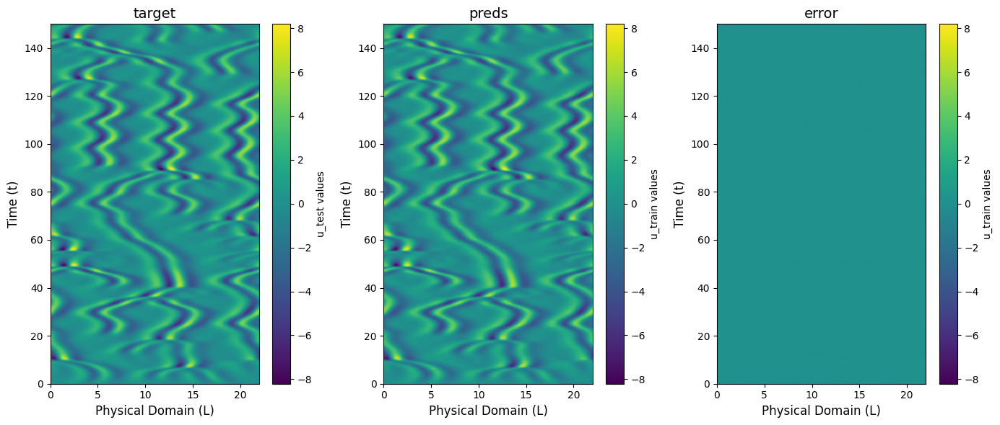

In [32]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, u_test.shape[0])  # Domaine physique
t = torch.linspace(0, T, u_test.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_test.min(), preds.min(), np.abs(preds - encoded_output_test).min())
vmax = max(encoded_output_test.max(), preds.max(), np.abs(preds - encoded_output_test).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_test (target)
im1 = axs[0].imshow(encoded_output_test, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds
im2 = axs[1].imshow(preds, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds - encoded_output_test), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="u_train values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [29]:
with torch.no_grad():
    preds_train = model(encoded_input_train)

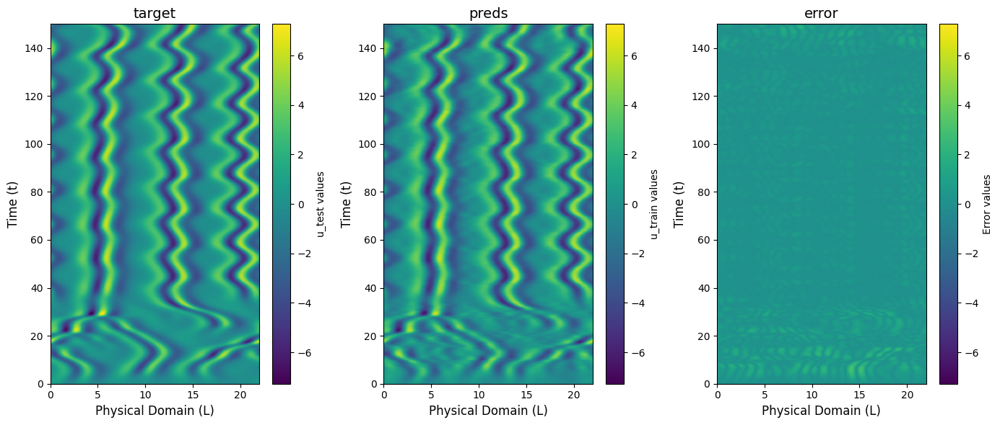

In [34]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(encoded_output_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(preds_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds_train - encoded_output_train), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [35]:
with torch.no_grad():
    preds = model(encoded_input_test)
    pred_1 = model(encoded_input_test, indexes=[0], sum_w=False)
    pred_2 = model(encoded_input_test, indexes=[1], sum_w=False)
    pred_w = model(encoded_input_test, indexes=0, sum_w=True)

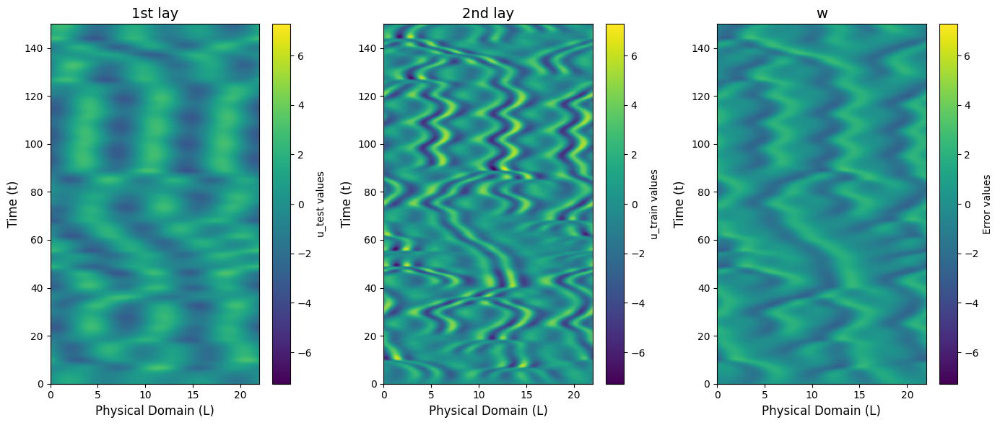

In [36]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(pred_1, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("1st lay", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(pred_2, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("2nd lay", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(pred_w, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("w", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

# SANS W

In [46]:
model = torch.load(os.path.join(os.path.abspath(''), "trained_models/fno/model_8.pt"))

/var/folders/53/d3ng48y138s7ldywsyn64jj00000gn/T/ipykernel_78967/2136269469.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(os.path.join(os.path.abspa

In [47]:
with torch.no_grad():
    preds = model(encoded_input_test)

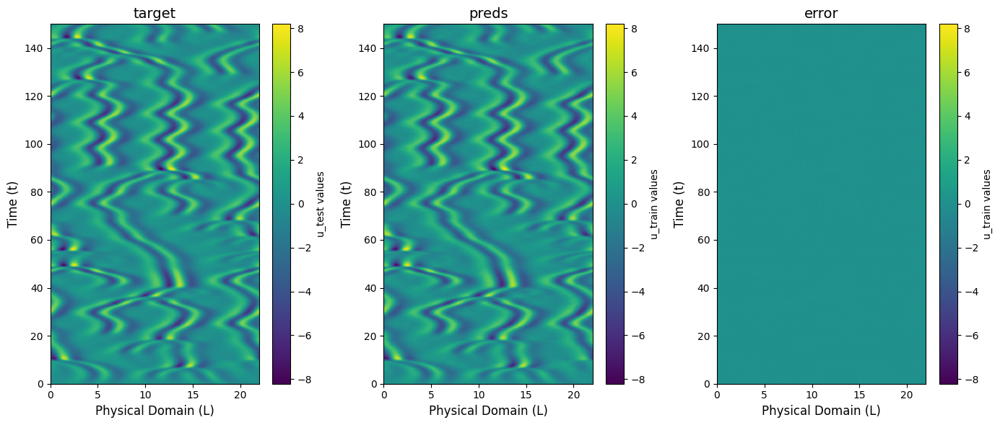

In [48]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, u_test.shape[0])  # Domaine physique
t = torch.linspace(0, T, u_test.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_test.min(), preds.min(), np.abs(preds - encoded_output_test).min())
vmax = max(encoded_output_test.max(), preds.max(), np.abs(preds - encoded_output_test).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_test (target)
im1 = axs[0].imshow(encoded_output_test, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds
im2 = axs[1].imshow(preds, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds - encoded_output_test), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="u_train values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [49]:
with torch.no_grad():
    preds_train = model(encoded_input_train)

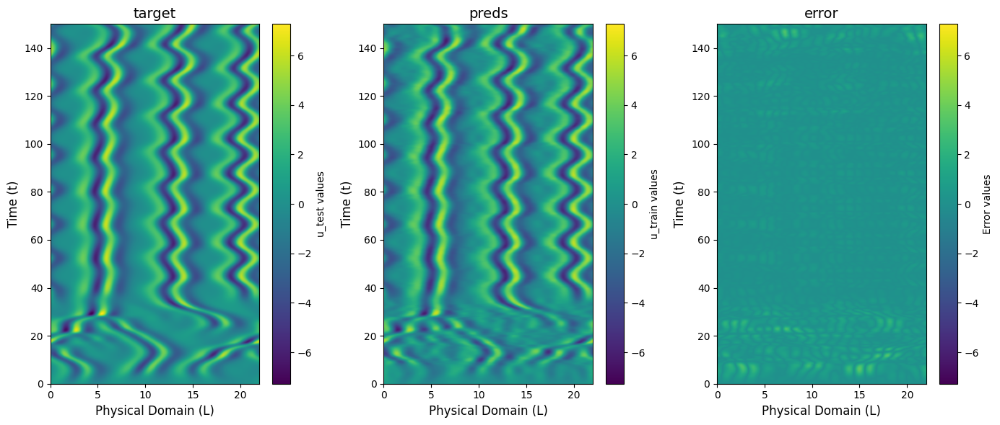

In [50]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(encoded_output_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(preds_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds_train - encoded_output_train), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [51]:
with torch.no_grad():
    preds = model(encoded_input_test)
    pred_1 = model(encoded_input_test, indexes=[0], sum_w=False)
    pred_2 = model(encoded_input_test, indexes=[1], sum_w=False)
    pred_w = model(encoded_input_test, indexes=0, sum_w=True)

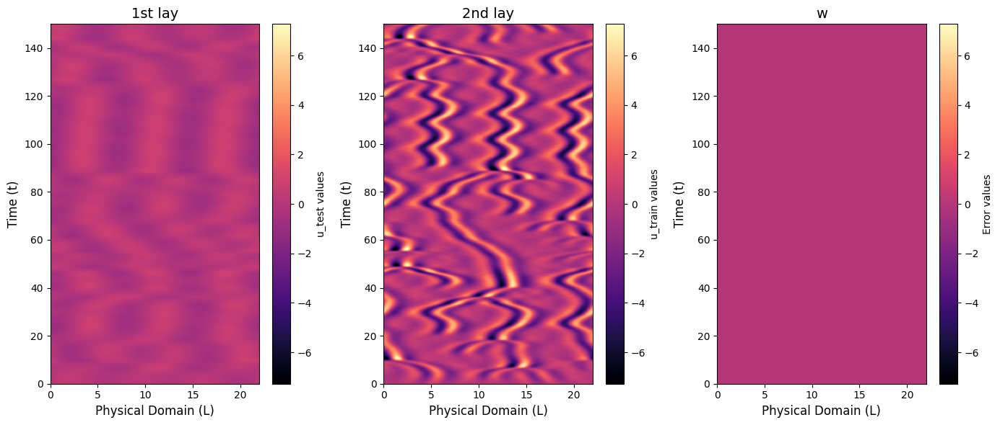

In [52]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(pred_1, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[0].set_title("1st lay", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(pred_2, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[1].set_title("2nd lay", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(pred_w, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[2].set_title("w", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [53]:
pred_1.mean(), pred_1.var()

(tensor(0.0003), tensor(0.1752))

# 8-16

In [18]:
model = torch.load(os.path.join(os.path.abspath(''), "trained_models/fno/model_9.pt"))

/var/folders/53/d3ng48y138s7ldywsyn64jj00000gn/T/ipykernel_78967/2523436933.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(os.path.join(os.path.abspa

In [19]:
with torch.no_grad():
    preds = model(encoded_input_test)

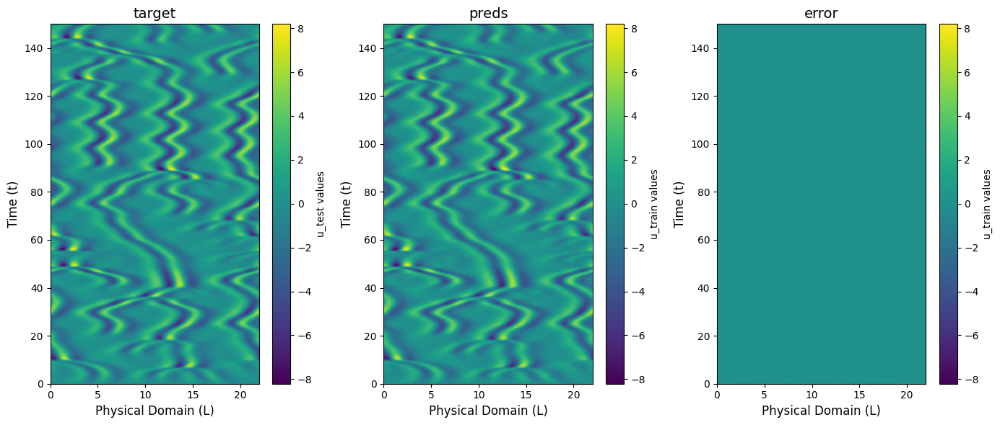

In [20]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, u_test.shape[0])  # Domaine physique
t = torch.linspace(0, T, u_test.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_test.min(), preds.min(), np.abs(preds - encoded_output_test).min())
vmax = max(encoded_output_test.max(), preds.max(), np.abs(preds - encoded_output_test).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_test (target)
im1 = axs[0].imshow(encoded_output_test, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds
im2 = axs[1].imshow(preds, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds - encoded_output_test), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="u_train values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [21]:
with torch.no_grad():
    preds_train = model(encoded_input_train)

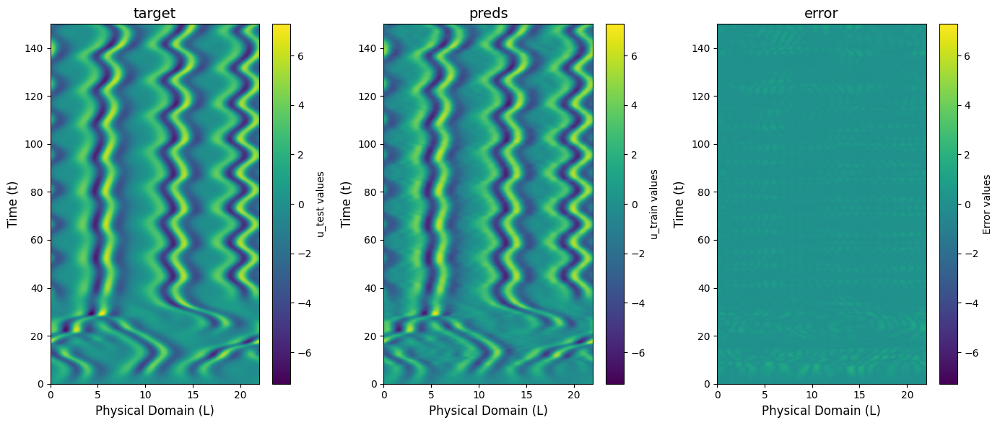

In [22]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(encoded_output_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(preds_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds_train - encoded_output_train), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [23]:
with torch.no_grad():
    preds = model(encoded_input_test)
    pred_1 = model(encoded_input_test, indexes=[0], sum_w=False)
    pred_2 = model(encoded_input_test, indexes=[1], sum_w=False)
    pred_w = model(encoded_input_test, indexes=0, sum_w=True)

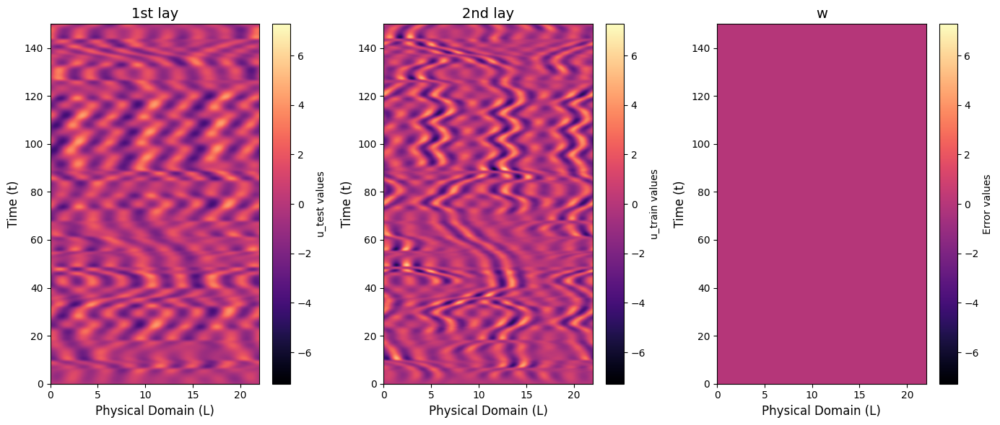

In [24]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(pred_1, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[0].set_title("1st lay", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(pred_2, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[1].set_title("2nd lay", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(pred_w, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[2].set_title("w", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

# W only last modes 6-12 FNO

In [5]:
model = torch.load(os.path.join(os.path.abspath(''), "trained_models/fno/model_11.pt"))

/var/folders/53/d3ng48y138s7ldywsyn64jj00000gn/T/ipykernel_1135/4265577674.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(os.path.join(os.path.abspat

In [6]:
with torch.no_grad():
    preds = model(encoded_input_test)

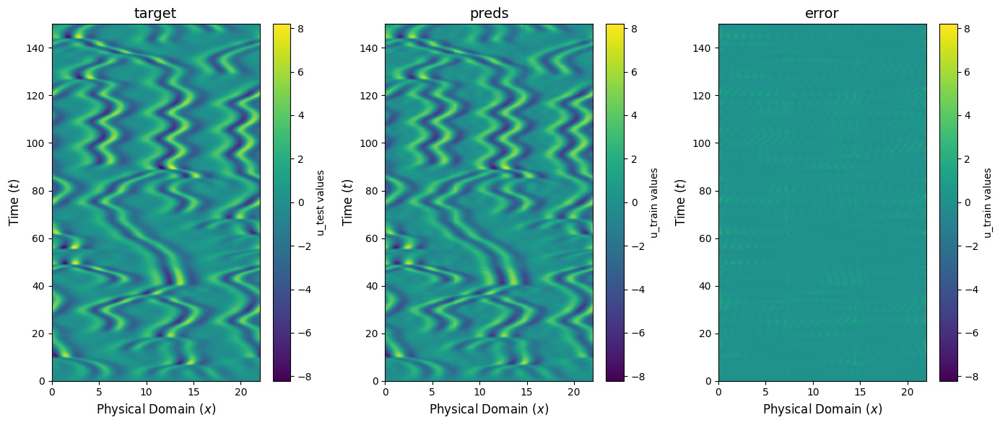

In [7]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, u_test.shape[0])  # Domaine physique
t = torch.linspace(0, T, u_test.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_test.min(), preds.min(), np.abs(preds - encoded_output_test).min())
vmax = max(encoded_output_test.max(), preds.max(), np.abs(preds - encoded_output_test).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_test (target)
im1 = axs[0].imshow(encoded_output_test, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain $(x)$", fontsize=12)
axs[0].set_ylabel("Time $(t)$", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds
im2 = axs[1].imshow(preds, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain $(x)$", fontsize=12)
axs[1].set_ylabel("Time $(t)$", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds - encoded_output_test), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain $(x)$", fontsize=12)
axs[2].set_ylabel("Time $(t)$", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="u_train values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

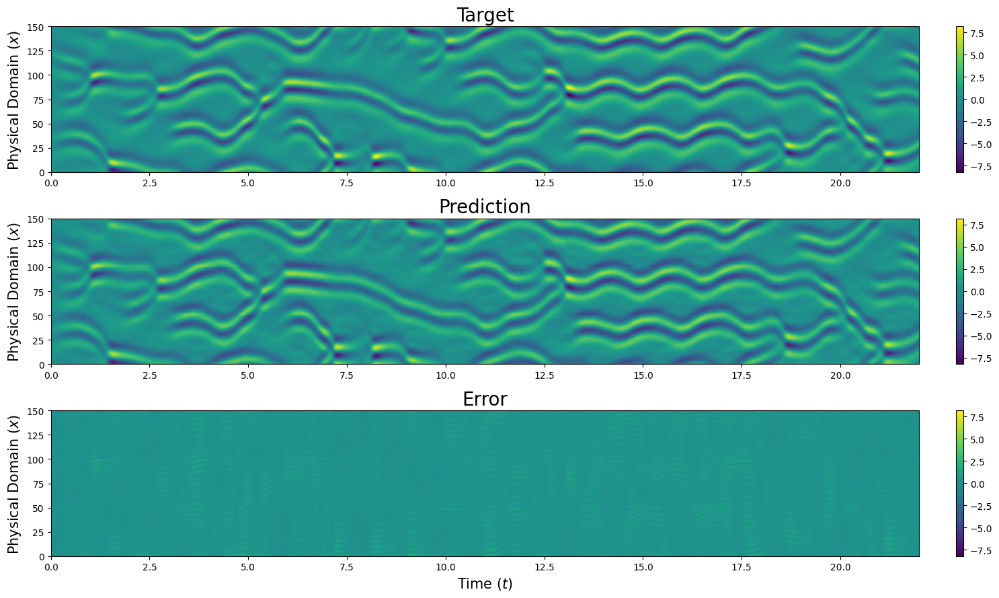

In [8]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, u_test.shape[0])  # Domaine physique
t = torch.linspace(0, T, u_test.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_test.min(), preds.min(), np.abs(preds - encoded_output_test).min())
vmax = max(encoded_output_test.max(), preds.max(), np.abs(preds - encoded_output_test).max())

# Créer les sous-graphiques avec une seule colonne (superposés verticalement)
fig, axs = plt.subplots(3, 1, figsize=(15,9), gridspec_kw={'height_ratios': [1, 1, 1]})

# Afficher encoded_output_test (target)
im1 = axs[0].imshow(encoded_output_test.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("Target", fontsize=20)
axs[0].set_ylabel("Physical Domain $(x)$", fontsize=15)
#axs[0].set_xlabel("Time $(t)$", fontsize=15)
fig.colorbar(im1, ax=axs[0], orientation='vertical', fraction=0.02, pad=0.04)

# Afficher preds
im2 = axs[1].imshow(preds.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("Prediction", fontsize=20)
axs[1].set_ylabel("Physical Domain $(x)$", fontsize=15)
#axs[1].set_xlabel("Time $(t)$", fontsize=15)
fig.colorbar(im2, ax=axs[1], orientation='vertical', fraction=0.02, pad=0.04)

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds - encoded_output_test).T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("Error", fontsize=20)
axs[2].set_ylabel("Physical Domain $(x)$", fontsize=15)
axs[2].set_xlabel("Time $(t)$", fontsize=15)
fig.colorbar(im3, ax=axs[2], orientation='vertical', fraction=0.02, pad=0.04)

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [9]:
with torch.no_grad():
    preds_train = model(encoded_input_train)

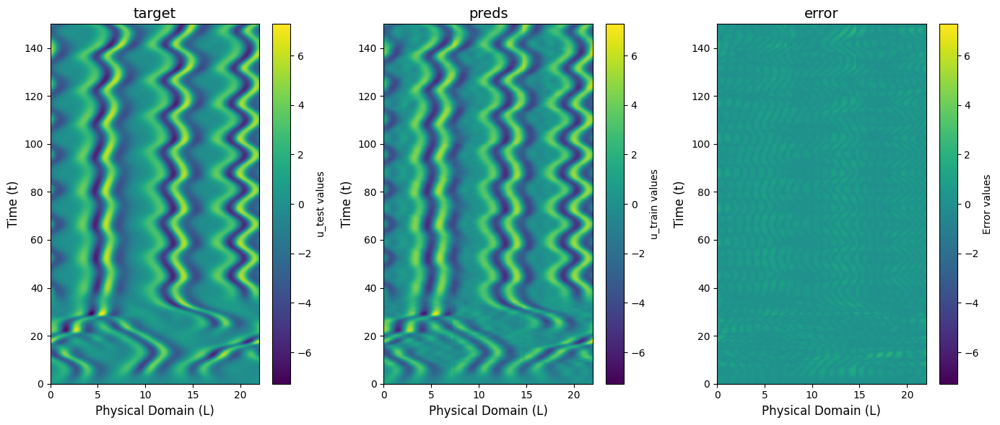

In [10]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(encoded_output_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(preds_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds_train - encoded_output_train), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [11]:
with torch.no_grad():
    preds = model(encoded_input_test)
    pred_1 = model(encoded_input_test, indexes=[0], sum_w=False)
    pred_2 = model(encoded_input_test, indexes=[1], sum_w=False)
    pred_w = model(encoded_input_test, indexes=0, sum_w=True)

In [17]:
preds.max(), pred_2.max(), pred_1.max()

(tensor(7.3187), tensor(6.8881), tensor(1.7748))

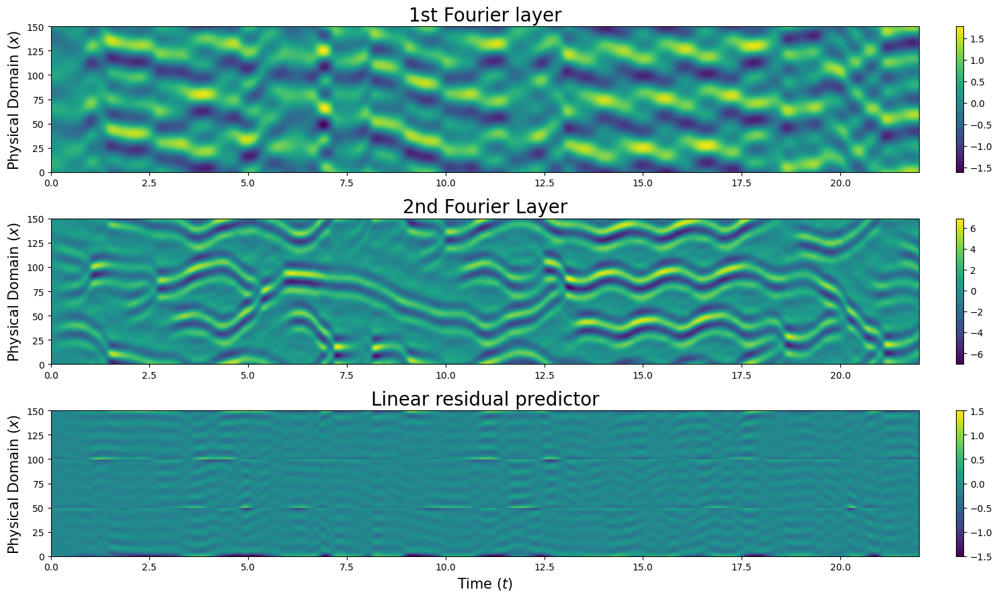

In [12]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques avec une seule colonne (superposés)
fig, axs = plt.subplots(3, 1, figsize=(15,9), gridspec_kw={'height_ratios': [1, 1, 1]})

# Afficher pred_1 (1st Fourier layer)
im1 = axs[0].imshow(pred_1.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis')
axs[0].set_title("1st Fourier layer", fontsize=20)
axs[0].set_ylabel(r"Physical Domain $(x)$", fontsize=15)
#axs[0].set_xlabel(r"Time $(t)$", fontsize=15)
fig.colorbar(im1, ax=axs[0], orientation='vertical', fraction=0.02, pad=0.04)

# Afficher pred_2 (2nd Fourier layer)
im2 = axs[1].imshow(pred_2.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis')
axs[1].set_title("2nd Fourier Layer", fontsize=20)
axs[1].set_ylabel(r"Physical Domain $(x)$", fontsize=15)
#axs[1].set_xlabel(r"Time $(t)$", fontsize=15)
fig.colorbar(im2, ax=axs[1], orientation='vertical', fraction=0.02, pad=0.04)

# Afficher pred_w (Linear residual predictor)
im3 = axs[2].imshow(pred_w.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=-1.5, vmax=1.5)
axs[2].set_title("Linear residual predictor", fontsize=20)
axs[2].set_ylabel(r"Physical Domain $(x)$", fontsize=15)
axs[2].set_xlabel(r"Time $(t)$", fontsize=15)
fig.colorbar(im3, ax=axs[2], orientation='vertical', fraction=0.02, pad=0.04)

# Ajuster la mise en page
plt.tight_layout()
plt.show()

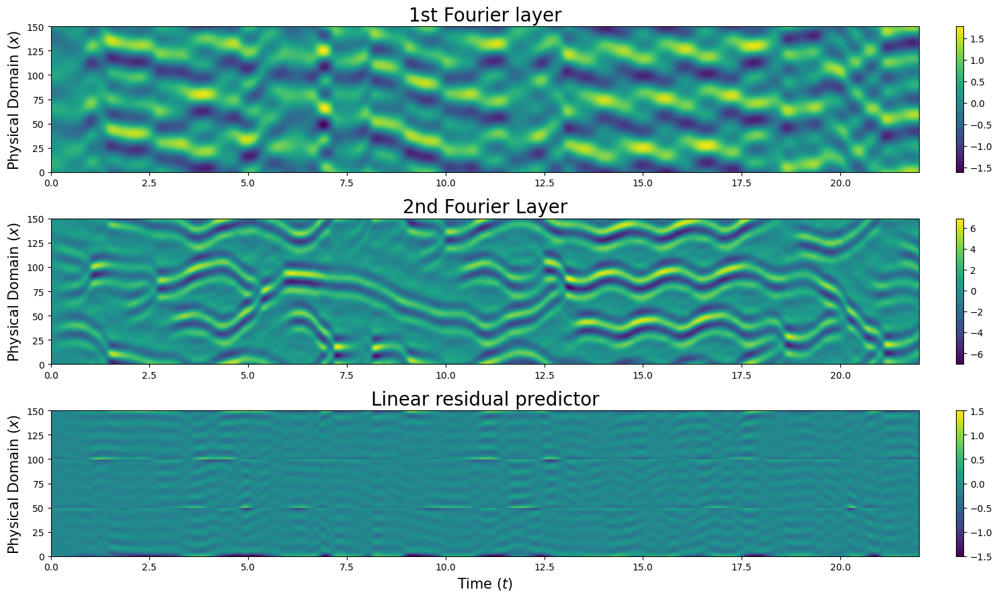

In [13]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques avec une seule colonne (superposés)
fig, axs = plt.subplots(3, 1, figsize=(15,9), gridspec_kw={'height_ratios': [1, 1, 1]})

# Afficher pred_1 (1st Fourier layer)
im1 = axs[0].imshow(pred_1.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis')
axs[0].set_title("1st Fourier layer", fontsize=20)
axs[0].set_ylabel(r"Physical Domain $(x)$", fontsize=15)
#axs[0].set_xlabel(r"Time $(t)$", fontsize=15)
fig.colorbar(im1, ax=axs[0], orientation='vertical', fraction=0.02, pad=0.04)

# Afficher pred_2 (2nd Fourier layer)
im2 = axs[1].imshow(pred_2.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis')
axs[1].set_title("2nd Fourier Layer", fontsize=20)
axs[1].set_ylabel(r"Physical Domain $(x)$", fontsize=15)
#axs[1].set_xlabel(r"Time $(t)$", fontsize=15)
fig.colorbar(im2, ax=axs[1], orientation='vertical', fraction=0.02, pad=0.04)

# Afficher pred_w (Linear residual predictor)
im3 = axs[2].imshow(pred_w.T, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=-1.5, vmax=1.5)
axs[2].set_title("Linear residual predictor", fontsize=20)
axs[2].set_ylabel(r"Physical Domain $(x)$", fontsize=15)
axs[2].set_xlabel(r"Time $(t)$", fontsize=15)
fig.colorbar(im3, ax=axs[2], orientation='vertical', fraction=0.02, pad=0.04)

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [90]:
err_1 = np.sqrt(((pred_1 - encoded_output_test)**2).mean(axis=1)/((encoded_output_test)**2).mean(axis=1)).mean()
err_2 = np.sqrt(((pred_1 + pred_2 - encoded_output_test)**2).mean(axis=1)/((encoded_output_test)**2).mean(axis=1)).mean()
err_w = np.sqrt(((pred_1 + pred_2 + pred_w - encoded_output_test)**2).mean(axis=1)/((encoded_output_test)**2).mean(axis=1)).mean()
err_w

tensor(0.1591)

In [83]:
pred_1.shape

torch.Size([2401, 256])

# W only last modes 5-10-15 FNO

In [24]:
model = torch.load(os.path.join(os.path.abspath(''), "trained_models/fno/model_13.pt"))

/var/folders/53/d3ng48y138s7ldywsyn64jj00000gn/T/ipykernel_99663/3821295638.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(os.path.join(os.path.abspa

In [25]:
with torch.no_grad():
    preds = model(encoded_input_test)

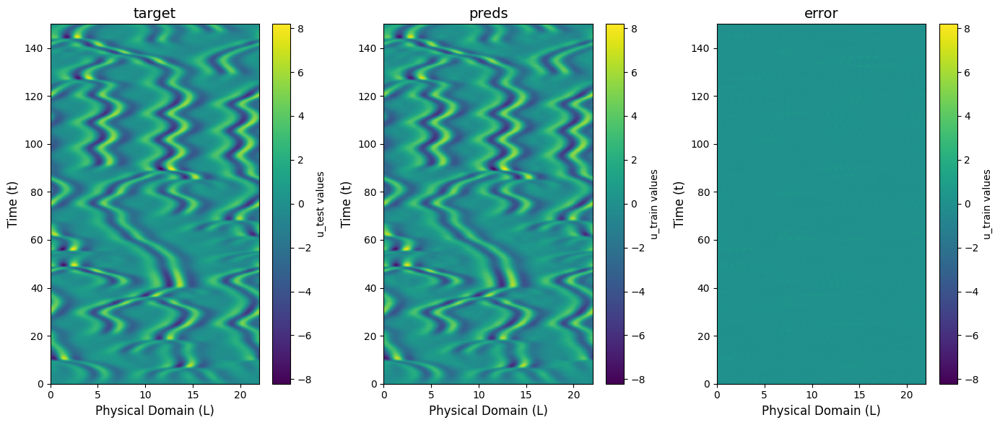

In [26]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, u_test.shape[0])  # Domaine physique
t = torch.linspace(0, T, u_test.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_test.min(), preds.min(), np.abs(preds - encoded_output_test).min())
vmax = max(encoded_output_test.max(), preds.max(), np.abs(preds - encoded_output_test).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_test (target)
im1 = axs[0].imshow(encoded_output_test, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds
im2 = axs[1].imshow(preds, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds - encoded_output_test), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="u_train values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [27]:
with torch.no_grad():
    preds_train = model(encoded_input_train)

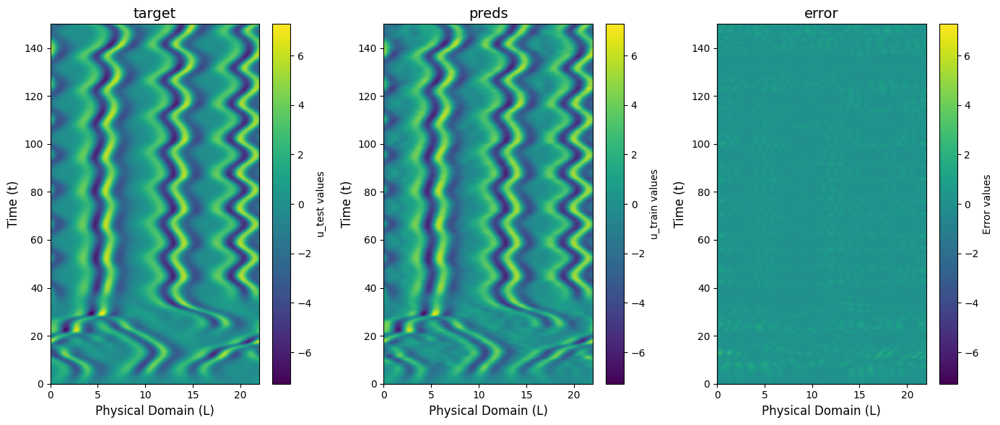

In [28]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 3, figsize=(14, 6))

# Afficher encoded_output_train (target)
im1 = axs[0].imshow(encoded_output_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[0].set_title("target", fontsize=14)
axs[0].set_xlabel("Physical Domain (L)", fontsize=12)
axs[0].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im1, ax=axs[0], orientation='vertical', label="u_test values")

# Afficher preds_train
im2 = axs[1].imshow(preds_train, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[1].set_title("preds", fontsize=14)
axs[1].set_xlabel("Physical Domain (L)", fontsize=12)
axs[1].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im2, ax=axs[1], orientation='vertical', label="u_train values")

# Afficher l'erreur absolue
im3 = axs[2].imshow(np.abs(preds_train - encoded_output_train), extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
axs[2].set_title("error", fontsize=14)
axs[2].set_xlabel("Physical Domain (L)", fontsize=12)
axs[2].set_ylabel("Time (t)", fontsize=12)
fig.colorbar(im3, ax=axs[2], orientation='vertical', label="Error values")

# Ajuster la mise en page
plt.tight_layout()
plt.show()

In [33]:
with torch.no_grad():
    preds = model(encoded_input_test)
    pred_1 = model(encoded_input_test, indexes=[0], sum_w=False)
    pred_2 = model(encoded_input_test, indexes=[1], sum_w=False)
    pred_3 = model(encoded_input_test, indexes=[2], sum_w=False)
    pred_w = model(encoded_input_test, indexes=0, sum_w=True)

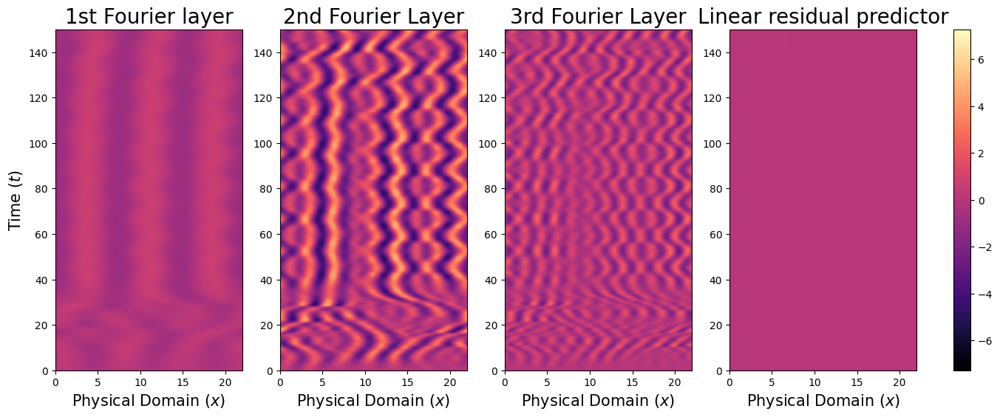

In [38]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 4, figsize=(16, 6))

# Afficher pred_1 (1st Fourier layer)
im1 = axs[0].imshow(pred_1, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[0].set_title("1st Fourier layer", fontsize=20)
axs[0].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
axs[0].set_ylabel(r"Time $(t)$", fontsize=15)

# Afficher pred_2 (2nd Fourier layer)
im2 = axs[1].imshow(pred_2, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[1].set_title("2nd Fourier Layer", fontsize=20)
axs[1].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
#axs[1].set_ylabel(r"Time $(t)$", fontsize=12)

# Afficher pred_3 (2nd Fourier layer)
im2 = axs[2].imshow(pred_3, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[2].set_title("3rd Fourier Layer", fontsize=20)
axs[2].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
#axs[2].set_ylabel(r"Time $(t)$", fontsize=12)

# Afficher pred_w (Linear residual predictor)
im3 = axs[3].imshow(pred_w, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[3].set_title("Linear residual predictor", fontsize=20)
axs[3].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
#axs[3].set_ylabel(r"Time $(t)$", fontsize=12)

# Ajouter une seule barre de couleur pour les trois sous-graphiques
cbar = fig.colorbar(im3, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)

# Ajuster la mise en page
#plt.tight_layout()
plt.show()

In [36]:
with torch.no_grad():
    preds = model(encoded_input_train)
    pred_1 = model(encoded_input_train, indexes=[0], sum_w=False)
    pred_2 = model(encoded_input_train, indexes=[1], sum_w=False)
    pred_3 = model(encoded_input_train, indexes=[2], sum_w=False)
    pred_w = model(encoded_input_train, indexes=0, sum_w=True)

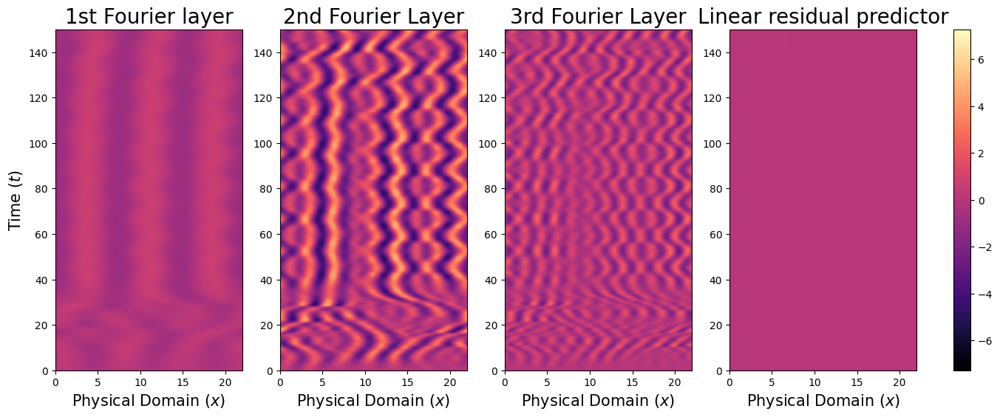

In [37]:
# Définir les dimensions du domaine physique et du temps
L = 22  # Domaine physique
T = 150  # Temps

# Générer les coordonnées physiques et temporelles
x = torch.linspace(0, L, encoded_output_train.shape[0])  # Domaine physique
t = torch.linspace(0, T, encoded_output_train.shape[1])  # Temps

# Calculer les limites globales pour la colormap
vmin = min(encoded_output_train.min(), preds_train.min(), np.abs(preds_train - encoded_output_train).min())
vmax = max(encoded_output_train.max(), preds_train.max(), np.abs(preds_train - encoded_output_train).max())

# Créer les sous-graphiques
fig, axs = plt.subplots(1, 4, figsize=(16, 6))

# Afficher pred_1 (1st Fourier layer)
im1 = axs[0].imshow(pred_1, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[0].set_title("1st Fourier layer", fontsize=20)
axs[0].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
axs[0].set_ylabel(r"Time $(t)$", fontsize=15)

# Afficher pred_2 (2nd Fourier layer)
im2 = axs[1].imshow(pred_2, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[1].set_title("2nd Fourier Layer", fontsize=20)
axs[1].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
#axs[1].set_ylabel(r"Time $(t)$", fontsize=12)

# Afficher pred_3 (2nd Fourier layer)
im2 = axs[2].imshow(pred_3, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[2].set_title("3rd Fourier Layer", fontsize=20)
axs[2].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
#axs[2].set_ylabel(r"Time $(t)$", fontsize=12)

# Afficher pred_w (Linear residual predictor)
im3 = axs[3].imshow(pred_w, extent=[0, L, 0, T], aspect='auto', origin='lower', cmap='magma', vmin=vmin, vmax=vmax)
axs[3].set_title("Linear residual predictor", fontsize=20)
axs[3].set_xlabel(r"Physical Domain $(x)$", fontsize=15)
#axs[3].set_ylabel(r"Time $(t)$", fontsize=12)

# Ajouter une seule barre de couleur pour les trois sous-graphiques
cbar = fig.colorbar(im3, ax=axs, orientation='vertical', fraction=0.02, pad=0.04)

# Ajuster la mise en page
#plt.tight_layout()
plt.show()